In [1]:
import os
import random
import shutil
import yaml
from collections import defaultdict

# =========================
# CONFIG
# =========================
SRC_ROOT = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset"
DST_ROOT = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_400"

MAX_PER_CLASS = 400
MIN_VAL_PER_CLASS = 30
MIN_TEST_PER_CLASS = 30

SEED = 42
splits = ["train", "valid", "test"]
random.seed(SEED)

# =========================
# CLASS NAMES (68)
# =========================
class_names = [
    "Banh canh","Banh chung","Banh cuon","Banh khot","Banh mi","Banh trang",
    "Banh trang tron","Banh xeo","Bo kho","Bo la lot","Bong cai","Bun",
    "Bun bo Hue","Bun cha","Bun dau","Bun mam","Bun rieu","Ca","Ca chua",
    "Ca phao","Ca rot","Can h","Cha","Cha gio","Chanh","Com","Com tam",
    "Con nguoi","Cu kieu","Cua","Dau hu","Dua chua","Dua leo",
    "Goi cuon","Hamburger","Heo quay","Hu tieu","Kho qua thit","Khoai tay chien",
    "Lau","Long heo","Mi","Muc","Nam","Oc","Ot chuong","Pho","Pho mai",
    "Rau","Salad","Thit bo","Thit ga","Thit heo","Thit kho","Thit nuong",
    "Tom","Trung","Xoi","Banh beo","Cao lau","Mi Quang",
    "Com chien Duong Chau","Bun cha ca","Com chien ga","Chao long",
    "Nom hoa chuoi","Nui xao bo","Sup cua"
]

class_names = [str(x) for x in class_names]
nc = len(class_names)

# =========================
# PREPARE FOLDERS
# =========================
for s in splits:
    os.makedirs(os.path.join(DST_ROOT, "images", s), exist_ok=True)
    os.makedirs(os.path.join(DST_ROOT, "labels", s), exist_ok=True)

# =========================
# INDEX IMAGES BY CLASS
# =========================
class_to_images = defaultdict(list)

for s in splits:
    lbl_dir = os.path.join(SRC_ROOT, "labels", s)
    img_dir = os.path.join(SRC_ROOT, "images", s)

    if not os.path.exists(lbl_dir):
        continue

    for lbl in os.listdir(lbl_dir):
        if not lbl.endswith(".txt"):
            continue

        img = lbl.replace(".txt", ".jpg")
        img_path = os.path.join(img_dir, img)
        if not os.path.exists(img_path):
            continue

        with open(os.path.join(lbl_dir, lbl), encoding="utf-8") as f:
            for line in f:
                if line.strip():
                    cls = int(line.split()[0])
                    class_to_images[cls].append((s, img))

# =========================
# SELECT (GIỮ NGUYÊN + ÉP MIN VAL / TEST)
# =========================
selected = set()

for cls in range(nc):
    imgs = class_to_images.get(cls, [])
    if not imgs:
        continue

    random.shuffle(imgs)

    val_imgs = [x for x in imgs if x[0] == "valid"][:MIN_VAL_PER_CLASS]
    test_imgs = [x for x in imgs if x[0] == "test"][:MIN_TEST_PER_CLASS]

    remaining = [
        x for x in imgs
        if x not in val_imgs and x not in test_imgs
    ]

    train_imgs = remaining[:MAX_PER_CLASS]

    selected.update(val_imgs)
    selected.update(test_imgs)
    selected.update(train_imgs)

print(f"✅ Total selected images: {len(selected)}")

# =========================
# COPY FILES
# =========================
copied = 0
skipped = 0

for s, img in selected:
    src_img = os.path.join(SRC_ROOT, "images", s, img)
    src_lbl = os.path.join(SRC_ROOT, "labels", s, img.replace(".jpg", ".txt"))

    dst_img = os.path.join(DST_ROOT, "images", s, img)
    dst_lbl = os.path.join(DST_ROOT, "labels", s, img.replace(".jpg", ".txt"))

    if not os.path.exists(src_img) or not os.path.exists(src_lbl):
        skipped += 1
        continue

    shutil.copy2(src_img, dst_img)
    shutil.copy2(src_lbl, dst_lbl)
    copied += 1

print(f"✅ Copied: {copied}")
print(f"⚠️ Skipped (missing file): {skipped}")

# =========================
# CREATE YAML
# =========================
out_yaml = {
    "path": DST_ROOT,
    "train": "images/train",
    "val": "images/valid",
    "test": "images/test",
    "nc": nc,
    "names": {i: name for i, name in enumerate(class_names)}
}

yaml_path = os.path.join(DST_ROOT, "vietfood68_500.yaml")
with open(yaml_path, "w", encoding="utf-8") as f:
    yaml.safe_dump(out_yaml, f, allow_unicode=True, sort_keys=False)

print("✅ YAML created:", yaml_path)
print("🎉 DONE – GIỮ NGUYÊN LOGIC + VAL/TEST ≥ 20 ẢNH / CLASS")


✅ Total selected images: 28261
✅ Copied: 28261
⚠️ Skipped (missing file): 0
✅ YAML created: C:\Users\PC\Downloads\food_selected_pho_bun\dataset_400\vietfood68_500.yaml
🎉 DONE – GIỮ NGUYÊN LOGIC + VAL/TEST ≥ 20 ẢNH / CLASS


In [2]:
import os
import random
import shutil
import yaml
from collections import defaultdict
import pandas as pd

# =========================
# CONFIG
# =========================
SRC_ROOT = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset"
DST_ROOT = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered2"

QUOTA = {"train": 1100, "valid": 50, "test": 50}
SEED = 42
random.seed(SEED)

# =========================
# ORIGINAL CLASSES
# =========================
original_classes = [
    "Banh canh","Banh chung","Banh cuon","Banh khot","Banh mi","Banh trang",
    "Banh trang tron","Banh xeo","Bo kho","Bo la lot","Bong cai","Bun",
    "Bun bo Hue","Bun cha","Bun dau","Bun mam","Bun rieu","Ca","Ca chua",
    "Ca phao","Ca rot","Canh","Cha","Cha gio","Chanh","Com","Com tam",
    "Con nguoi","Cu kieu","Cua","Dau hu","Dua chua","Dua leo",
    "Goi cuon","Hamburger","Heo quay","Hu tieu","Kho qua thit","Khoai tay chien",
    "Lau","Long heo","Mi","Muc","Nam","Oc","Ot chuong","Pho","Pho mai",
    "Rau","Salad","Thit bo","Thit ga","Thit heo","Thit kho","Thit nuong",
    "Tom","Trung","Xoi","Banh beo","Cao lau","Mi Quang",
    "Com chien Duong Chau","Bun cha ca","Com chien ga","Chao long",
    "Nom hoa chuoi","Nui xao bo","Sup cua"
]

# =========================
# CHỈ GIỮ CÁC MÓN XUẤT HIỆN TRONG DETECTION HISTORY
# =========================
to_keep = [
    "Banh beo","Banh canh","Banh chung","Banh cuon","Banh khot","Banh mi",
    "Banh trang tron","Banh xeo","Bo kho","Bo la lot",
    "Bun bo Hue","Bun dau","Bun mam","Bun rieu","Cha","Cha gio","Chao long",
    "Com chien Duong Chau","Com chien ga","Com tam","Goi cuon","Hamburger",
    "Heo quay","Hu tieu","Kho qua thit","Khoai tay chien","Lau","Mi",
    "Mi Quang","Nom hoa chuoi","Nui xao bo","Pho","Sup cua",
    "Thit kho","Thit nuong","Tom","Xoi"
]

# =========================
# FILTER CLASSES
# =========================
new_class_names = [c for c in original_classes if c in to_keep]
old_to_new_id = {
    original_classes.index(name): i
    for i, name in enumerate(new_class_names)
}

print(f"✅ Giữ lại {len(new_class_names)} class")
print(f"❌ Loại bỏ {len(original_classes) - len(new_class_names)} class")

# =========================
# PREPARE FOLDERS
# =========================
splits = ["train", "valid", "test"]
if os.path.exists(DST_ROOT):
    shutil.rmtree(DST_ROOT)

for s in splits:
    os.makedirs(os.path.join(DST_ROOT, "images", s), exist_ok=True)
    os.makedirs(os.path.join(DST_ROOT, "labels", s), exist_ok=True)

# =========================
# SELECT IMAGES
# =========================
current_counts = {s: defaultdict(int) for s in splits}
all_selected_images = {s: set() for s in splits}

for s in splits:
    lbl_dir = os.path.join(SRC_ROOT, "labels", s)
    img_dir = os.path.join(SRC_ROOT, "images", s)
    if not os.path.exists(lbl_dir):
        continue

    files = [f for f in os.listdir(lbl_dir) if f.endswith(".txt")]
    random.shuffle(files)

    for lbl in files:
        img = lbl.replace(".txt", ".jpg")
        if not os.path.exists(os.path.join(img_dir, img)):
            continue

        valid_ids = []
        with open(os.path.join(lbl_dir, lbl)) as f:
            for line in f:
                parts = line.split()
                if not parts:
                    continue
                oid = int(parts[0])
                if oid in old_to_new_id:
                    valid_ids.append(old_to_new_id[oid])

        if not valid_ids:
            continue

        if any(current_counts[s][i] < QUOTA[s] for i in set(valid_ids)):
            all_selected_images[s].add(lbl)
            for i in set(valid_ids):
                current_counts[s][i] += 1

# =========================
# COPY FILES
# =========================
for s in splits:
    for lbl in all_selected_images[s]:
        img = lbl.replace(".txt", ".jpg")
        shutil.copy2(
            os.path.join(SRC_ROOT, "images", s, img),
            os.path.join(DST_ROOT, "images", s, img)
        )

        with open(os.path.join(SRC_ROOT, "labels", s, lbl)) as fin, \
             open(os.path.join(DST_ROOT, "labels", s, lbl), "w") as fout:
            for line in fin:
                parts = line.split()
                if not parts:
                    continue
                oid = int(parts[0])
                if oid in old_to_new_id:
                    fout.write(f"{old_to_new_id[oid]} {' '.join(parts[1:])}\n")

# =========================
# YAML
# =========================
yaml_data = {
    "path": DST_ROOT,
    "train": "images/train",
    "val": "images/valid",
    "test": "images/test",
    "nc": len(new_class_names),
    "names": {i: n for i, n in enumerate(new_class_names)}
}

with open(os.path.join(DST_ROOT, "food_refined.yaml"), "w", encoding="utf-8") as f:
    yaml.safe_dump(yaml_data, f, allow_unicode=True, sort_keys=False)

# =========================
# SUMMARY
# =========================
rows = []
for i, name in enumerate(new_class_names):
    rows.append({
        "ID": i,
        "Tên món": name,
        "Train": current_counts["train"][i],
        "Valid": current_counts["valid"][i],
        "Test": current_counts["test"][i],
    })

df = pd.DataFrame(rows)
print(df.to_string(index=False))

print("\n🎉 DONE | Dataset sạch 38 class tại:")
print(DST_ROOT)


✅ Giữ lại 37 class
❌ Loại bỏ 31 class
 ID              Tên món  Train  Valid  Test
  0            Banh canh   1428     50    50
  1           Banh chung   1113     50    23
  2            Banh cuon   1275     50    50
  3            Banh khot   1124     50    34
  4              Banh mi   1255     55    50
  5      Banh trang tron   1119     50    38
  6             Banh xeo   1263     50    50
  7               Bo kho   1275     50    50
  8            Bo la lot   1133     50    50
  9           Bun bo Hue   1514     50    50
 10              Bun dau   1611     50    50
 11              Bun mam   1266     50    50
 12             Bun rieu   1687     50    50
 13                  Cha   1841     63    60
 14              Cha gio   1266     52    52
 15              Com tam   1278     51    50
 16             Goi cuon   1170     50    49
 17            Hamburger   1412     50    50
 18             Heo quay   1355     53    50
 19              Hu tieu   1189     50    42
 20         Kho q

In [ ]:
import os
import yaml
import pandas as pd
from collections import defaultdict

# =========================
# CONFIGURATION
# =========================
# Thay đổi đường dẫn này tới bộ dataset đã lọc của bạn
DATA_YAML = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered\food_refined.yaml"
DST_ROOT = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered"

def check_and_summarize_dataset():
    # 1. Load thông tin từ YAML
    if not os.path.exists(DATA_YAML):
        print(f"❌ Không tìm thấy file YAML tại: {DATA_YAML}")
        return

    with open(DATA_YAML, "r", encoding="utf-8") as f:
        data_cfg = yaml.safe_load(f)
        new_names = data_cfg["names"]
        nc = data_cfg["nc"]

    print(f"--- ĐANG KIỂM TRA DATASET: {len(new_names)} CLASSES ---")
    
    splits = ["train", "valid", "test"]
    overall_stats = {s: defaultdict(int) for s in splits}
    issues = []

    # 2. Duyệt qua từng tập dữ liệu
    for s in splits:
        img_dir = os.path.join(DST_ROOT, "images", s)
        lbl_dir = os.path.join(DST_ROOT, "labels", s)
        
        if not os.path.exists(img_dir) or not os.path.exists(lbl_dir):
            print(f"⚠️ Cảnh báo: Thiếu thư mục cho tập {s}")
            continue

        imgs = {os.path.splitext(f)[0] for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))}
        lbls = {os.path.splitext(f)[0] for f in os.listdir(lbl_dir) if f.endswith('.txt')}

        # Kiểm tra khớp file ảnh - nhãn
        mismatch_img = imgs - lbls
        mismatch_lbl = lbls - imgs
        if mismatch_img: issues.append(f"[{s}] {len(mismatch_img)} ảnh thiếu file nhãn (.txt)")
        if mismatch_lbl: issues.append(f"[{s}] {len(mismatch_lbl)} nhãn thiếu file ảnh")

        # Kiểm tra nội dung từng file nhãn
        for lbl_name in lbls:
            lbl_path = os.path.join(lbl_dir, lbl_name + ".txt")
            with open(lbl_path, "r") as f:
                lines = f.readlines()
                if not lines:
                    issues.append(f"[{s}] File nhãn trống: {lbl_name}.txt")
                    continue
                
                classes_in_file = set()
                for line in lines:
                    parts = line.split()
                    if len(parts) != 5:
                        issues.append(f"[{s}] Sai định dạng YOLO (cần 5 cột): {lbl_name}.txt")
                        continue
                    
                    try:
                        cls_id = int(parts[0])
                        if cls_id < 0 or cls_id >= nc:
                            issues.append(f"[{s}] ID {cls_id} nằm ngoài danh mục (0-{nc-1}) tại: {lbl_name}.txt")
                        else:
                            classes_in_file.add(cls_id)
                    except ValueError:
                        issues.append(f"[{s}] ID không phải là số tại: {lbl_name}.txt")

                # Cập nhật thống kê số lượng ảnh chứa class
                for cid in classes_in_file:
                    overall_stats[s][cid] += 1

    # 3. Xuất bảng thống kê số lượng
    results = []
    for i in range(nc):
        results.append({
            "ID": i,
            "Tên món": new_names[i],
            "Train": overall_stats["train"][i],
            "Valid": overall_stats["valid"][i],
            "Test": overall_stats["test"][i]
        })

    print("\n📊 BẢNG THỐNG KÊ SỐ LƯỢNG ẢNH MỖI LỚP:")
    df = pd.DataFrame(results)
    print(df.to_string(index=False))

    # 4. Kết luận độ sạch
    print("\n" + "="*50)
    print("🛡️ KIỂM TRA ĐỘ SẠCH (DATA INTEGRITY):")
    if not issues:
        print("✅ TUYỆT VỜI: Dataset hoàn toàn sạch. Không phát hiện lỗi file hay ID lạ.")
    else:
        print(f"❌ PHÁT HIỆN {len(issues)} LỖI:")
        for issue in issues[:10]: # In tối đa 10 lỗi đầu tiên
            print(f"   - {issue}")
        if len(issues) > 10:
            print(f"   ... và {len(issues) - 10} lỗi khác.")
    print("="*50)

# Chạy kiểm tra
check_and_summarize_dataset()

❌ Không tìm thấy file YAML tại: C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered\food_refined2.yaml


In [2]:
import yaml

yaml_path = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\food_refined.yaml"

with open(yaml_path, "r", encoding="utf-8") as f:
    data = yaml.safe_load(f)

class_names = data["names"]
print("📦 Tổng số class:", len(class_names))


📦 Tổng số class: 50


In [3]:
import os
import cv2
import matplotlib.pyplot as plt

IMG_DIR = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\images\train"
LABEL_DIR = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\labels\train"

class_to_image = {}

for label_file in os.listdir(LABEL_DIR):
    if not label_file.endswith(".txt"):
        continue

    label_path = os.path.join(LABEL_DIR, label_file)
    with open(label_path, "r") as f:
        lines = f.readlines()

    if not lines:
        continue

    for line in lines:
        cls_id = int(line.split()[0])

        if cls_id not in class_to_image:
            img_name = label_file.replace(".txt", ".jpg")
            img_path = os.path.join(IMG_DIR, img_name)

            if os.path.exists(img_path):
                class_to_image[cls_id] = img_path

print(f"✅ Tìm được ảnh cho {len(class_to_image)} class")


✅ Tìm được ảnh cho 50 class


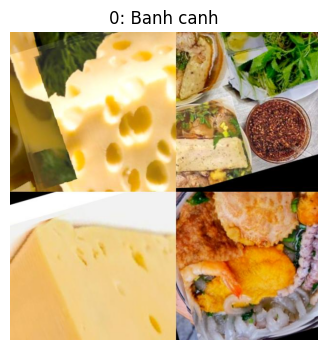

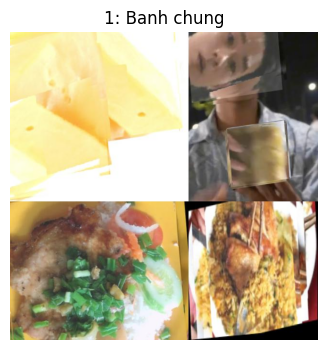

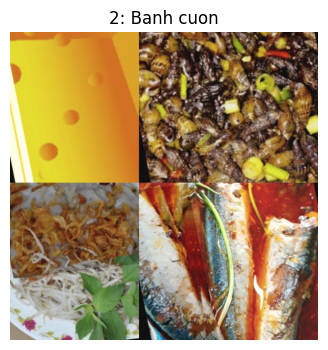

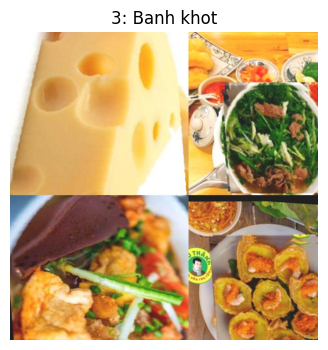

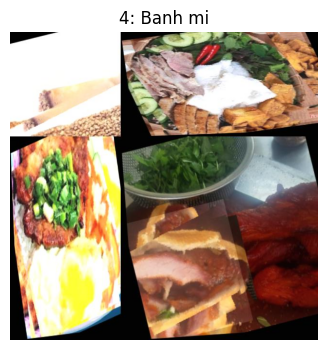

...

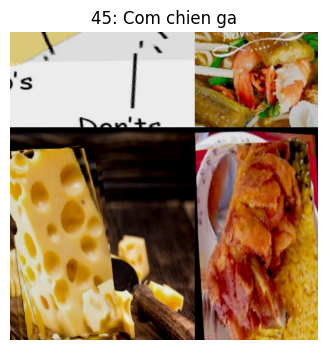

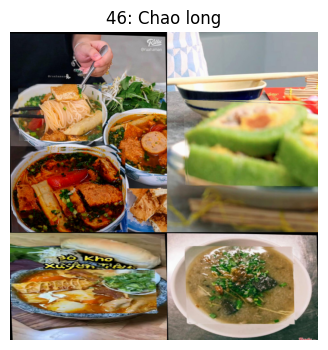

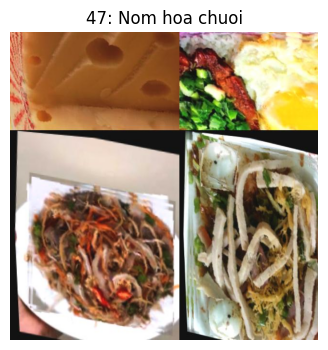

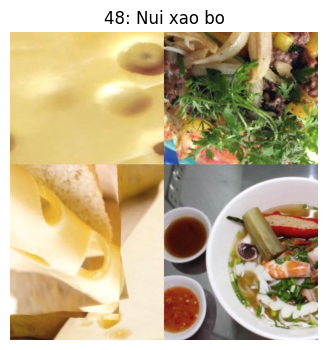

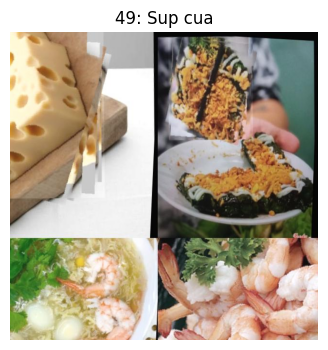

In [4]:
for cls_id, img_path in sorted(class_to_image.items()):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.title(f"{cls_id}: {class_names[cls_id]}")
    plt.axis("off")
    plt.show()


In [7]:
import os
import cv2
import matplotlib.pyplot as plt

# ===== CONFIG =====
BUN_CHA_ID = 12   # ⚠️ đổi nếu class id khác
NUM_IMAGES = 10

IMG_DIR = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\images\test"
LABEL_DIR = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\labels\test"

selected_imgs = []

# ===== FIND IMAGES CONTAINING BUN CHA =====
for label_file in os.listdir(LABEL_DIR):
    if not label_file.endswith(".txt"):
        continue

    label_path = os.path.join(LABEL_DIR, label_file)
    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls_id = int(line.split()[0])
        if cls_id == BUN_CHA_ID:
            img_name = label_file.replace(".txt", ".jpg")
            img_path = os.path.join(IMG_DIR, img_name)

            if os.path.exists(img_path):
                selected_imgs.append(img_path)
            break

    if len(selected_imgs) >= NUM_IMAGES:
        break

print(f"🍜 Tìm được {len(selected_imgs)} ảnh Bún chả")


🍜 Tìm được 10 ảnh Bún chả


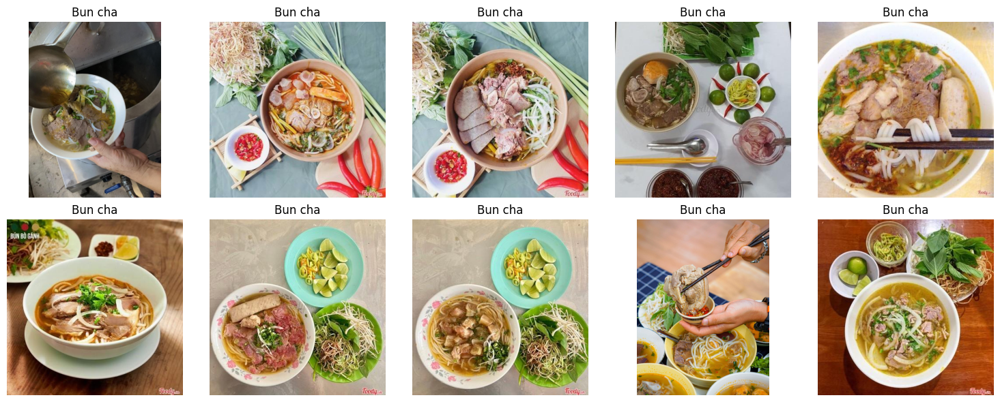

In [8]:
cols = 5
rows = (len(selected_imgs) + cols - 1) // cols

plt.figure(figsize=(15, 6))
for i, img_path in enumerate(selected_imgs):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title("Bun cha")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [9]:
import os
import shutil

# ===== CONFIG =====
BUN_CHA_ID = 12
NUM_IMAGES = 2

IMG_DIR = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\images\test"
LABEL_DIR = r"C:\Users\PC\Downloads\food_selected_pho_bun\dataset_filtered_2\dataset_filtered_2\labels\test"

OUT_DIR = r"C:\Users\PC\Downloads\test_model"
os.makedirs(OUT_DIR, exist_ok=True)

saved = 0

for label_file in os.listdir(LABEL_DIR):
    if not label_file.endswith(".txt"):
        continue

    label_path = os.path.join(LABEL_DIR, label_file)
    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        cls_id = int(line.split()[0])
        if cls_id == BUN_CHA_ID:
            img_name = label_file.replace(".txt", ".jpg")
            img_path = os.path.join(IMG_DIR, img_name)

            if os.path.exists(img_path):
                shutil.copy(img_path, OUT_DIR)
                # nếu muốn copy luôn label thì mở dòng dưới
                shutil.copy(label_path, OUT_DIR)

                print(f"✅ Copied: {img_name}")
                saved += 1
            break

    if saved >= NUM_IMAGES:
        break

print(f"🎉 Đã lưu {saved} ảnh Bún chả vào {OUT_DIR}")


✅ Copied: 107_jpg.rf.f91b68ecf6bb16258a280187a46167b2.jpg
✅ Copied: 130_jpg.rf.eadb3fdc65157288438581486d9f8a7c.jpg
🎉 Đã lưu 2 ảnh Bún chả vào C:\Users\PC\Downloads\test_model
